In [1]:
! pip install -q kaggle

In [2]:
!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv /content/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

rm: cannot remove '/root/.kaggle': No such file or directory
ref                                                         title                                              size  lastUpdated          downloadCount  
----------------------------------------------------------  ------------------------------------------------  -----  -------------------  -------------  
gpreda/reddit-vaccine-myths                                 Reddit Vaccine Myths                              235KB  2021-09-27 06:59:16          12897  
crowww/a-large-scale-fish-dataset                           A Large Scale Fish Dataset                          3GB  2021-04-28 17:03:01           7804  
imsparsh/musicnet-dataset                                   MusicNet Dataset                                   22GB  2021-02-18 14:12:19           3375  
dhruvildave/wikibooks-dataset                               Wikibooks Dataset                                   2GB  2021-07-03 18:37:20           3029  
fatiimaezzahra/

In [3]:
!kaggle datasets download defileroff/comic-faces-paired-synthetic-v2 -p /content/sample_data/ --unzip

100% 2.17G/2.18G [00:41<00:00, 74.2MB/s]
100% 2.18G/2.18G [00:41<00:00, 56.5MB/s]


In [7]:
path="/content/sample_data/face2comics_v2.0.0_by_Sxela/face2comics_v2.0.0_by_Sxela/"
!mkdir "/content/trainimgs/"
import os
imgs=os.listdir(path+"comics")
num_images=500
imgnames=imgs[:num_images]
import cv2
from tqdm import tqdm
for i in tqdm(imgnames):
  img=cv2.imread(path+"faces/"+i)
  img2=cv2.imread(path+"comics/"+i)
  img=cv2.resize(img,(256,256))
  img2=cv2.resize(img2,(256,256))
  newimg=cv2.hconcat([img,img2])
  cv2.imwrite("/content/trainimgs/"+i,newimg)

100%|██████████| 500/500 [00:16<00:00, 30.14it/s]


In [8]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

In [9]:
PATH=pathlib.Path("/content/trainimgs")

In [10]:
def load(image_file):
  img=tf.io.read_file(image_file)
  img=tf.io.decode_jpeg(img)
  w=tf.shape(img)[1]
  w=w//2
  inpimg=img[:,:w,:]
  outimg=img[:,w:,:]
  inpimg=tf.cast(inpimg,tf.float32)
  outimg=tf.cast(outimg,tf.float32)
  return inpimg,outimg

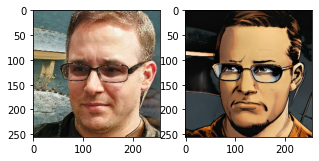

In [12]:
a,b=load(str(PATH/"1001.jpg"))
plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(a/255)
plt.subplot(1,2,2)
plt.imshow(b/255)
plt.show()

In [13]:
BUFFER_SIZE=500
BATCH_SIZE=1
IMGH=256
IMGW=256

In [14]:
def resize(a,b,h,w):
  a=tf.image.resize(a,[h,w],method="nearest")
  b=tf.image.resize(b,[h,w],method="nearest")
  return a,b

def random_crop(a,b):
  stacked=tf.stack([a,b],axis=0)
  cropped=tf.image.random_crop(stacked,[2,IMGH,IMGW,3])
  return cropped[0],cropped[1]

def normalize(a,b):
  a=a/127.5-1.0
  b=b/127.5-1.0
  return a,b

In [15]:
@tf.function()
def random_jitter(inp,real):
  inp,real=resize(inp,real,286,286)
  inp,real=random_crop(inp,real)
  if tf.random.uniform(())>0.5:
    inp=tf.image.flip_left_right(inp)
    real=tf.image.flip_left_right(real)
  return inp,real

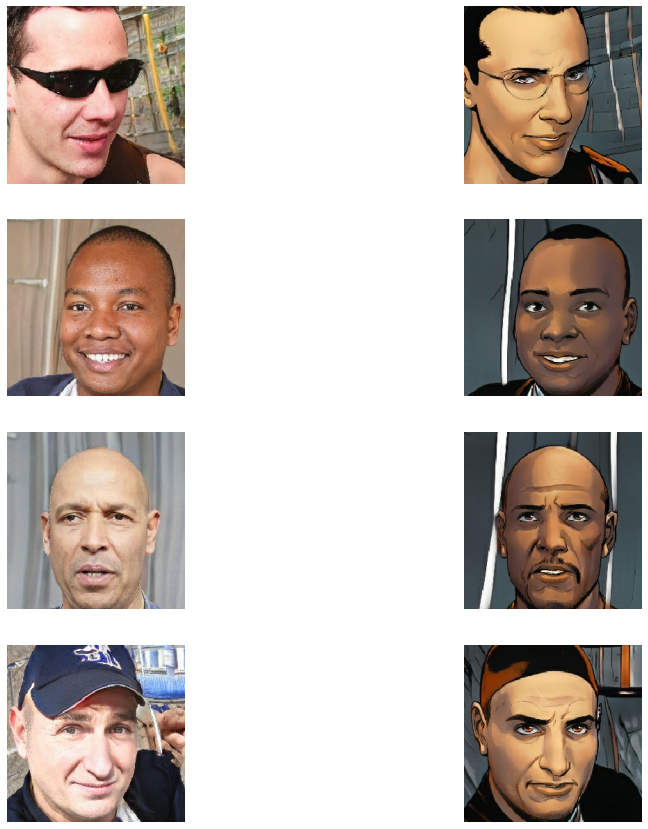

In [16]:
imgs=os.listdir(str(PATH))
plt.figure(figsize=(15,15))
for i in range(0,8,2):
  a,b=load(str(PATH/f'{imgs[i+1]}'))
  a,b=random_jitter(a,b)
  plt.subplot(4,2,i+1)
  plt.imshow(a/255.0)
  plt.axis('off')
  plt.subplot(4,2,i+2)
  plt.imshow(b/255.0)
  plt.axis('off')
plt.show()

In [17]:
def load_img_train(imfile):
  inp,real=load(imfile)
  inp,real=random_jitter(inp,real)
  inp,real=normalize(inp,real)
  return inp,real

In [18]:
def load_img_test(imfile):
  inp,real=load(imfile)
  inp,real=resize(inp,real,IMGH,IMGW)
  inp,real=normalize(inp,real)
  return inp,real

In [19]:
train_dataset=tf.data.Dataset.list_files(str(PATH/"*.jpg"))
train_dataset=train_dataset.map(load_img_train,num_parallel_calls=tf.data.AUTOTUNE)
train_dataset=train_dataset.shuffle(BUFFER_SIZE)
train_dataset=train_dataset.batch(BATCH_SIZE)

In [20]:
try:
  test_dataset=tf.data.Dataset.list_files(str(PATH/"*.jpg"))
except:
  test_dataset=tf.data.Dataset.list_files(str(PATH/"*.jpg"))
test_dataset=test_dataset.map(load_img_test)
test_dataset=test_dataset.batch(BATCH_SIZE)

In [21]:
OUTPUT_CHANNELS=3

In [22]:
def downsample(filters,size,apply_batchnorm=True):
  initializer=tf.random_normal_initializer(0.,0.02)
  result=tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters,size,2,"same",
                                    kernel_initializer=initializer,
                                    use_bias=False))
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())
  result.add(tf.keras.layers.LeakyReLU())
  return result

def upsample(filters,size,apply_dropout=False):
  initializer=tf.random_normal_initializer(0.,0.02)
  result=tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters,size,2,"same",
                                             kernel_initializer=initializer,
                                             use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())
  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))
  result.add(tf.keras.layers.ReLU())
  return result

In [23]:
def Generator():
  inputs=tf.keras.layers.Input(shape=[256,256,3])
  down_stack=[
              downsample(64,4,False),
              downsample(128,4),
              downsample(256,4),
              downsample(512,4),
              downsample(512,4),
              downsample(512,4),
              downsample(512,4),
              downsample(512,4)
  ]
  up_stack=[
            upsample(512,4,True),
            upsample(512,4,True),
            upsample(512,4,True),
            upsample(512,4),
            upsample(256,4),
            upsample(128,4),
            upsample(64,4)
  ]

  initializer=tf.random_normal_initializer(0.,0.02)
  last=tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS,4,2,"same",
                                       kernel_initializer=initializer,
                                       activation="tanh")

  x=inputs
  skips=[]
  for down in down_stack:
    x=down(x)
    skips.append(x)
  skips=reversed(skips[:-1])
  for up,skip in zip(up_stack,skips):
    x=up(x)
    x=tf.keras.layers.Concatenate()([x,skip])
  x=last(x)
  return tf.keras.Model(inputs=inputs,outputs=x)

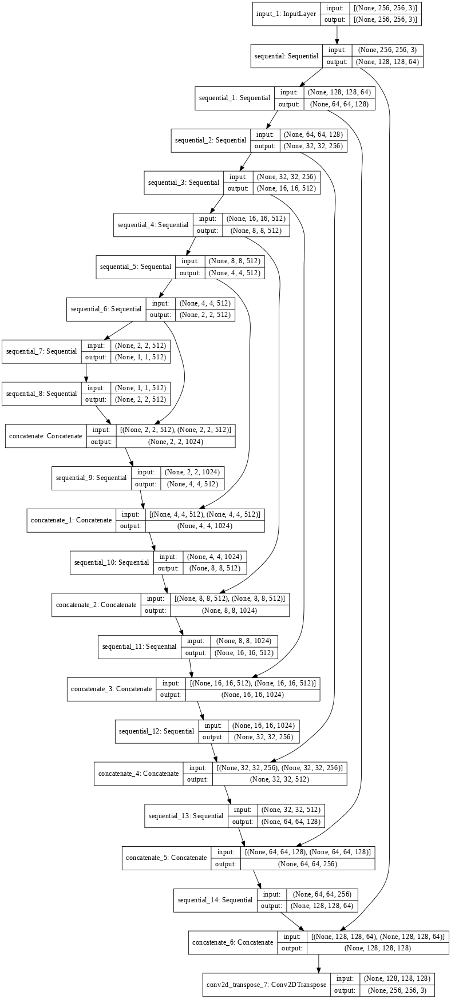

In [24]:
generator=Generator()
tf.keras.utils.plot_model(generator,show_shapes=True,dpi=64)

In [25]:
loss_object=tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output,generated,target):
  gan_loss=loss_object(tf.ones_like(disc_generated_output),disc_generated_output)
  LAMBDA=100
  l1_loss=tf.reduce_mean(tf.abs(generated-target))
  finloss=gan_loss + LAMBDA*l1_loss
  return finloss,gan_loss,l1_loss

In [26]:
def Discriminator():
  initializer=tf.random_normal_initializer(0.,0.02)
  input=tf.keras.layers.Input(shape=[256,256,3])
  target=tf.keras.layers.Input(shape=[256,256,3])
  x=tf.keras.layers.concatenate([input,target])
  x=downsample(64,4,False)(x)
  x=downsample(128,4)(x)
  x=downsample(256,4)(x)
  x=tf.keras.layers.ZeroPadding2D()(x)
  x=tf.keras.layers.Conv2D(512,4,1,kernel_initializer=initializer,use_bias=False)(x)
  x=tf.keras.layers.BatchNormalization()(x)
  x=tf.keras.layers.LeakyReLU()(x)
  x=tf.keras.layers.ZeroPadding2D()(x)
  x=tf.keras.layers.Conv2D(1,4,1,kernel_initializer=initializer)(x)
  return tf.keras.Model(inputs=[input,target],outputs=x)

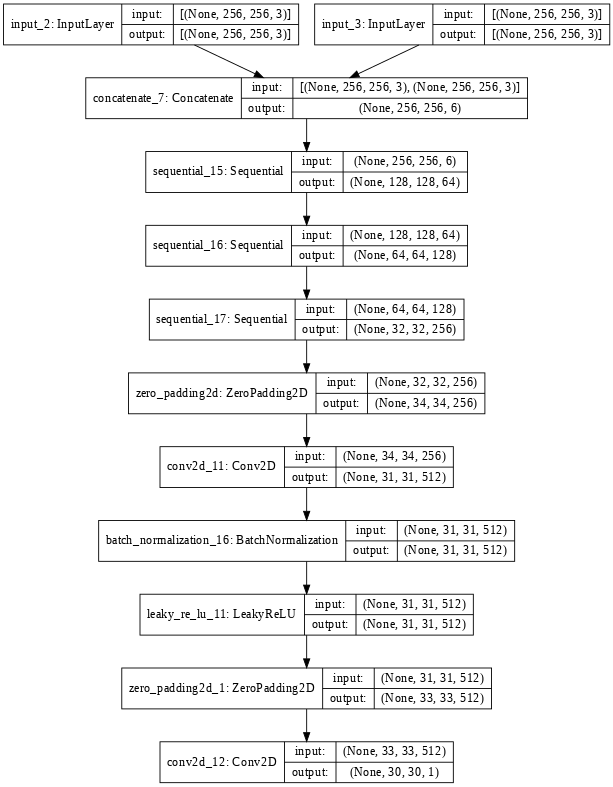

In [27]:
discriminator=Discriminator()
tf.keras.utils.plot_model(discriminator,show_shapes=True,dpi=64)

In [28]:
loss_object=tf.keras.losses.BinaryCrossentropy(from_logits=True)
def discriminator_loss(disc_generated_output,disc_real_output):
  real_loss=loss_object(tf.ones_like(disc_real_output),disc_real_output)
  gen_loss=loss_object(tf.zeros_like(disc_generated_output),disc_generated_output)
  tot_loss=real_loss+gen_loss
  return tot_loss

In [29]:
generator_optimizer=tf.keras.optimizers.Adam(2e-4,beta_1=0.5)
discriminator_optimizer=tf.keras.optimizers.Adam(2e-4,beta_1=0.5)

In [42]:
checkpoint_dir="./training_checkpoints"
checkpoint_prefix=os.path.join(checkpoint_dir,"ckpt")
checkpoint=tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                               discriminator_optimizer=discriminator_optimizer,
                               generator=generator,
                               discriminator=discriminator)

In [30]:
def generate_images(model,input,target):
  generated=model(input,training=True)
  images=[generated[0],input[0],target[0]]
  plt.figure(figsize=(20,60))
  for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(images[i]*0.5+0.5)
    # plt.axis(emit=False)
  plt.show()

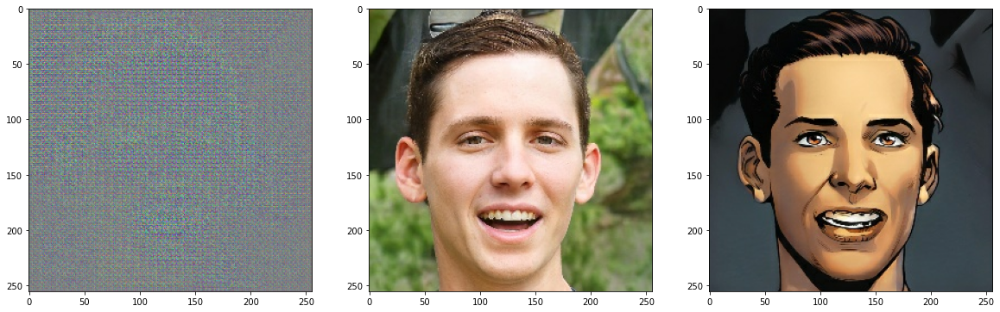

In [31]:
for exinput,extarget in test_dataset.take(1):
  generate_images(generator,exinput,extarget)

In [32]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [33]:
@tf.function
def train_step(input,target,step):
  with tf.GradientTape() as gentape, tf.GradientTape() as distape:
    genimg=generator(input,training=True)

    disgenoutput=discriminator([input,genimg],training=True)
    disrealoutput=discriminator([input,target],training=True)

    genloss,genganloss,genl1loss=generator_loss(disgenoutput,genimg,target)
    disloss=discriminator_loss(disgenoutput,disrealoutput)

  gengrads=gentape.gradient(genloss,generator.trainable_variables)
  disgrads=distape.gradient(disloss,discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(gengrads,generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(disgrads,discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', genloss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', genganloss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', genl1loss, step=step//1000)
    tf.summary.scalar('disc_loss', disloss, step=step//1000)

In [34]:
def fit(train_ds,test_ds,steps):
  for a,b in test_ds.take(1):
    exinp=a
    extar=b
  start=time.time()
  for step,(inp,tar) in train_ds.repeat().take(steps).enumerate():
    if (step+1)%1000==0:
      display.clear_output(wait=True)
      print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')
      generate_images(generator,exinp,extar)
      print(f"step : {step//1000}")
      start=time.time()
    train_step(inp,tar,step)
    if (step+1)%10==0:
      print('.',end='',flush=True)
    if (step+1)%5000==0:
      checkpoint.save(checkpoint_prefix)

In [35]:
# !pkill 377
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

Time taken for 1000 steps: 177.60 sec



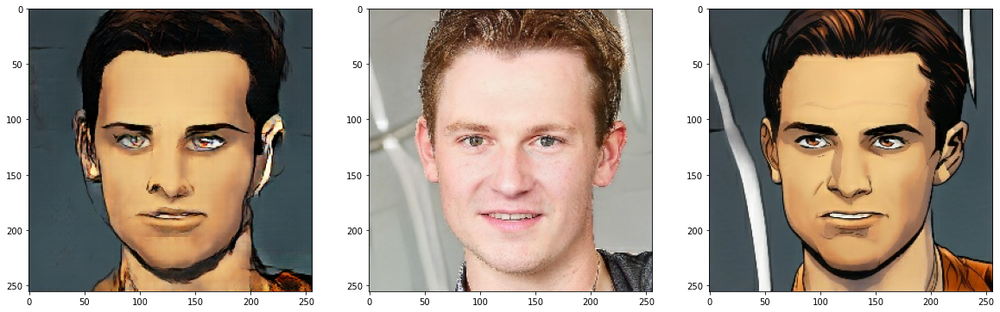

step : 29
...............................

KeyboardInterrupt: ignored

In [45]:
fit(train_dataset,test_dataset,40000)

In [40]:
from google.colab import drive
drive.mount("./content/")

Mounted at /content/gdrive
Mounted at ./content/


In [43]:
checkpointdir="/content/content/MyDrive/pix2pix-weights2/"
checkpoint.restore(tf.train.latest_checkpoint(checkpointdir))

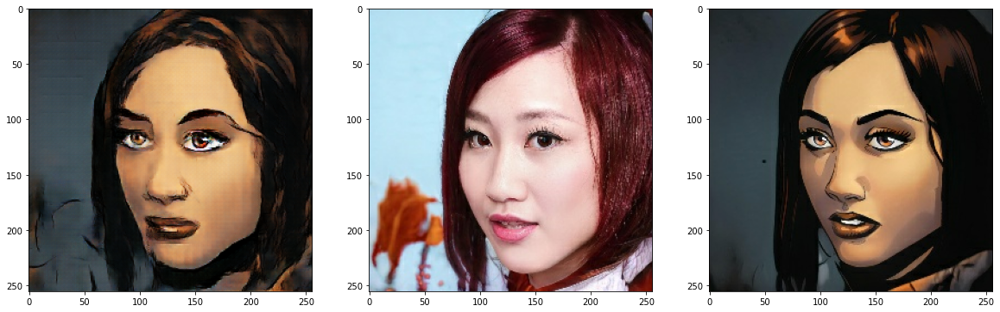

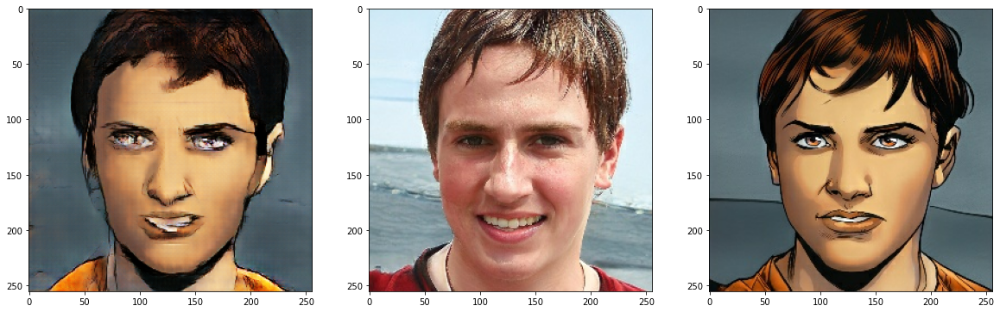

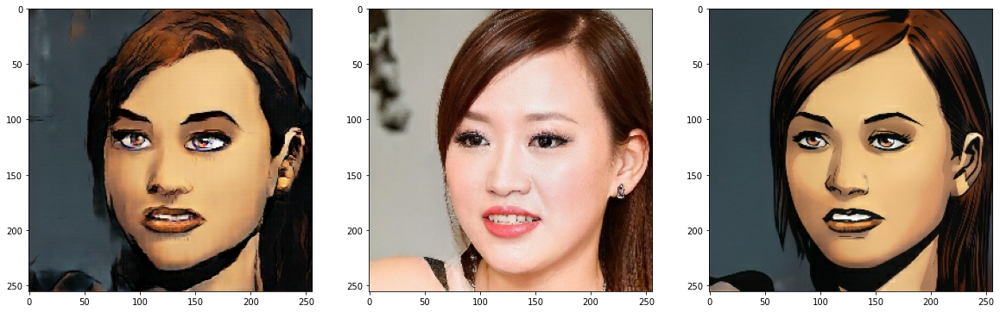

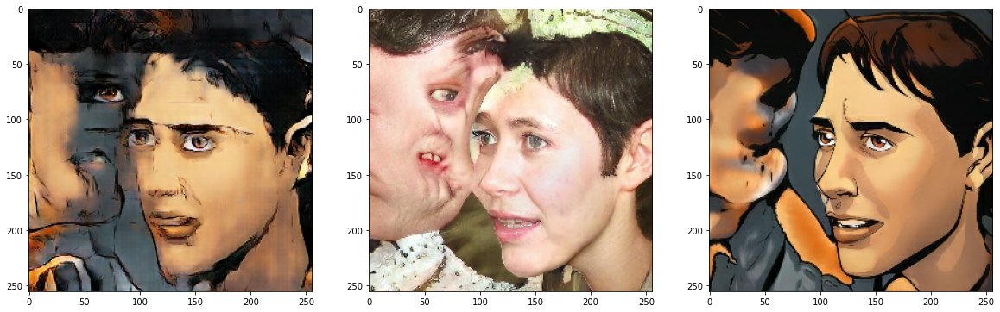

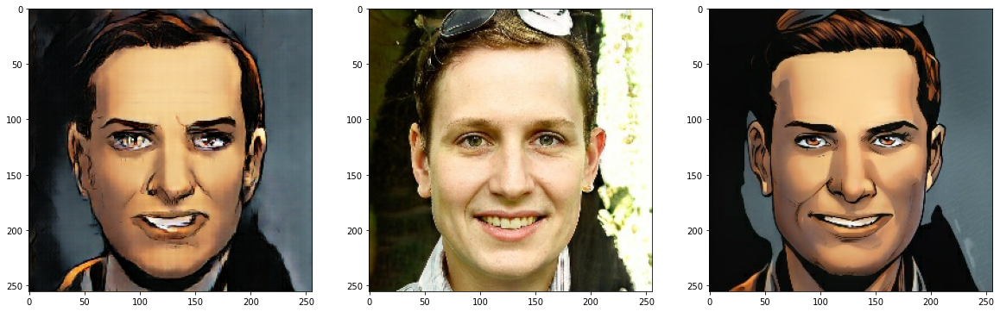

In [102]:
for a,b in test_dataset.take(5):
  generate_images(generator,a,b)

In [46]:
!cp /content/training_checkpoints/ckpt-10.index /content/content/MyDrive/pix2pix-weights2
!cp /content/training_checkpoints/ckpt-10.data-00000-of-00001 /content/content/MyDrive/pix2pix-weights2
!cp /content/training_checkpoints/checkpoint /content/content/MyDrive/pix2pix-weights2

In [104]:
def plot_imgs(a,b):
  plt.figure(figsize=(5,5))
  plt.subplot(1,2,1)
  plt.imshow(a)
  plt.subplot(1,2,2)
  plt.imshow(b)
  plt.show()

In [105]:
def infer(imgpath):
  img=tf.io.read_file(imgpath)
  img=tf.io.decode_jpeg(img)
  img=tf.image.resize(img,(256,256))
  img=(tf.expand_dims(img,0)-127.5)/127.5
  out=generator(img,training=True)
  plot_imgs(img[0]*0.5+0.5,(out[0]+1)/2)


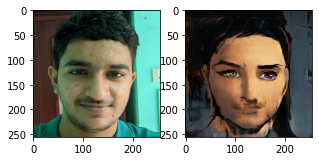

In [110]:
infer("/content/b.jpg")